# LIFE EXPECTANCY PREDICTION

# PROJECT SUMMARY
The Global Health Observatory (GHO) data repository under World Health Organization (WHO) keeps track of the health status as well as many other related factors for all countries The datasets are made available to public for the purpose of health data analysis. The dataset related to life expectancy, health factors for 193 countries has been collected from the same WHO data repository website and its corresponding economic data was collected from United Nation website. Among all categories of health-related factors only those critical factors were chosen which are more representative. It has been observed that in the past 15 years , there has been a huge development in health sector resulting in improvement of human mortality rates especially in the developing nations in comparison to the past 30 years. Therefore, in this project we have considered data from year 2000-2015 for 193 countries for further analysis. The individual data files have been merged together into a single dataset. On initial visual inspection of the data showed some missing values. As the datasets were from WHO, we found no evident errors. Missing data was handled in Python software by using fillna command. The result indicated that most of the missing data was for population, Hepatitis B and GDP. The missing data were from less known countries like Vanuatu, Tonga, Togo,Cabo Verde etc. Finding all data for these countries was difficult and hence, it was decided that we exclude these countries from the final model dataset. The final merged file(final dataset) consists of 22 Columns and 2938 rows which meant 20 predicting variables. All predicting variables was then divided into several broad categories:​Immunization related factors, Mortality factors, Economical factors and Social factors.

# Importing all the necessary library for this project

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib_inline
import datetime

# Importing the data from database(DATA READING)
Data set stored in a df named variable.

In [3]:
df=pd.read_excel("Life_Expectancy_Data.xlsx")

# DATA VIEW
Data set first view/Top view

In [4]:
df.head(1)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.25921,33736494.0,17.2,17.3,0.479,10.1


In [5]:
#Data set shape(Rows and columns) and size

In [6]:
df.shape

(2938, 22)

In [7]:
df.size

64636

In [8]:
#Data set bottom view

In [9]:
df.tail(1)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
2937,Zimbabwe,2000,Developing,46.0,665.0,24,1.68,0.0,79.0,1483,...,78.0,7.1,78.0,43.5,547.358878,12222251.0,11.0,11.2,0.434,9.8


In [10]:
#Data set useful information 

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [12]:
# Data set different aspects view like mean ,count ,std & outliers detection.

In [13]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [14]:
#checking null value in each column

In [15]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                448
Population                         652
thinness  1-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
dtype: int64

In [16]:
#checking column names

In [17]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

In [18]:
# Renaming the column name for better observation with understanding

In [19]:
df_life=df.rename(columns={'Country':'Country', 'Year':'Year', 'Status':'Status', 'Life expectancy':'Life_Expectancy', 'Adult Mortality':'Adult_Mortality',
       'infant deaths':'Infant_deaths', 'Alcohol':'Alcohol_Consum', 'percentage expenditure':'Percentage_Expenditure', 'Hepatitis B':'Hepatitis_B',
       'Measles':'Measeles', 'BMI':'BMI', 'under-five deaths':'Under_five_age_deaths', 'Polio':'Polio', 'Total expenditure':'Total_Expenditure',
       'Diphtheria':'Diabates', 'HIV/AIDS':'HIV_AIDS', 'GDP':'GDP', 'Population':'Population', 'thinness  1-19 years':'Thin_1_19_age',
       'thinness 5-9 years':'Thin_5_9_age', 'Income composition of resources':'Income_Resources', 'Schooling':'Education'})

In [20]:
#checking duplicate data and as result no duplicate data found.

In [21]:
df_life[df_life.duplicated()]

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_deaths,Alcohol_Consum,Percentage_Expenditure,Hepatitis_B,Measeles,...,Polio,Total_Expenditure,Diabates,HIV_AIDS,GDP,Population,Thin_1_19_age,Thin_5_9_age,Income_Resources,Education


In [22]:
# checking all unique data in every column using def function 

In [23]:
def get_uniquevalues(df_life):
    unique_values=df_life.apply
    return unique_values

unq_values=get_uniquevalues(df_life)

for i in df_life.columns.tolist():
    print('No of unique values in', i, 'is', df_life[i].nunique())

No of unique values in Country is 193
No of unique values in Year is 16
No of unique values in Status is 2
No of unique values in Life_Expectancy is 362
No of unique values in Adult_Mortality is 425
No of unique values in Infant_deaths is 209
No of unique values in Alcohol_Consum is 1076
No of unique values in Percentage_Expenditure is 2328
No of unique values in Hepatitis_B is 87
No of unique values in Measeles is 958
No of unique values in BMI is 608
No of unique values in Under_five_age_deaths is 252
No of unique values in Polio is 73
No of unique values in Total_Expenditure is 818
No of unique values in Diabates is 81
No of unique values in HIV_AIDS is 200
No of unique values in GDP is 2490
No of unique values in Population is 2278
No of unique values in Thin_1_19_age is 200
No of unique values in Thin_5_9_age is 207
No of unique values in Income_Resources is 625
No of unique values in Education is 173


# EDA (EXPLORATORY DATA ANALYSIS)

In [24]:
# Treating Null value in the data set using median of the data set(column)

In [25]:
df_life['Hepatitis_B'].fillna(df_life['Hepatitis_B'].median(),inplace=True)
df_life['Life_Expectancy'].fillna(df_life['Life_Expectancy'].median(),inplace=True)
df_life['Adult_Mortality'].fillna(df_life['Adult_Mortality'].median(),inplace=True)
df_life['Alcohol_Consum'].fillna(df_life['Alcohol_Consum'].median(),inplace=True)
df_life['BMI'].fillna(df_life['BMI'].median(),inplace=True)
df_life['Polio'].fillna(df_life['Polio'].median(),inplace=True)
df_life['GDP'].fillna(df_life['GDP'].median(),inplace=True)
df_life['Population'].fillna(df_life['Population'].median(),inplace=True)
df_life['Thin_1_19_age'].fillna(df_life['Thin_1_19_age'].median(),inplace=True)
df_life['Thin_5_9_age'].fillna(df_life['Thin_5_9_age'].median(),inplace=True)
df_life['Income_Resources'].fillna(df_life['Income_Resources'].median(),inplace=True)
df_life['Education'].fillna(df_life['Education'].median(),inplace=True)
df_life['Total_Expenditure'].fillna(df_life['Total_Expenditure'].median(),inplace=True)
df_life['Diabates'].fillna(df_life['Diabates'].median(),inplace=True)

In [26]:
#After treating the null value in the data set ,rechecking the null value in the data set

In [27]:
df_life.isnull().sum()

Country                   0
Year                      0
Status                    0
Life_Expectancy           0
Adult_Mortality           0
Infant_deaths             0
Alcohol_Consum            0
Percentage_Expenditure    0
Hepatitis_B               0
Measeles                  0
BMI                       0
Under_five_age_deaths     0
Polio                     0
Total_Expenditure         0
Diabates                  0
HIV_AIDS                  0
GDP                       0
Population                0
Thin_1_19_age             0
Thin_5_9_age              0
Income_Resources          0
Education                 0
dtype: int64

In [28]:
#checking the outliers

#def remove_outlier(df):
    df_copy = df.copy()  # Create a copy of the DataFrame
    for col in df_copy.columns:
        if pd.api.types.is_numeric_dtype(df_copy[col]):  # Check if the column is numeric
            q1 = df_copy[col].quantile(0.25)
            q3 = df_copy[col].quantile(0.75)

            iqr = q3 - q1

            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr

            df_copy = df_copy[(df_copy[col] >= lower_bound) & (df_copy[col] <= upper_bound)]
    return df_copy

df_life_without_outliers = remove_outlier(df_life)
#After applying IQR method to df_life data frame,80% data are outliers so we are not going to applying IQR method,we decided to continue with outliers full data.


#After applying Z-skore method to df_life data frame,33% data are outliers so we are not going to applying Z-skore,we decided to continue with outliers full data. 
#for col in df_life.columns:
    if pd.api.types.is_numeric_dtype(df_life[col]):  # Check if the column is numeric
        mean = df_life[col].mean()
        std = df_life[col].std()
        threshold = 3
        outliers = df_life[(df_life[col] - mean).abs() > threshold * std]
        df_life = df_life.drop(outliers.index)

In [29]:
#VISUALIZATION OF DATA SET

In [30]:
df_life.head(1)

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_deaths,Alcohol_Consum,Percentage_Expenditure,Hepatitis_B,Measeles,...,Polio,Total_Expenditure,Diabates,HIV_AIDS,GDP,Population,Thin_1_19_age,Thin_5_9_age,Income_Resources,Education
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.25921,33736494.0,17.2,17.3,0.479,10.1


# VISUALIZATION

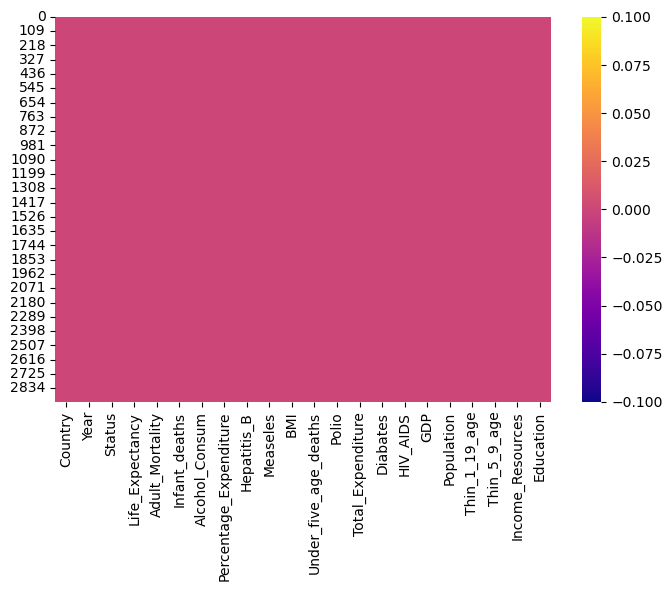

In [31]:
plt.figure(figsize=(8,5))
sns.heatmap(df_life.isnull(),cmap='plasma')
plt.show()

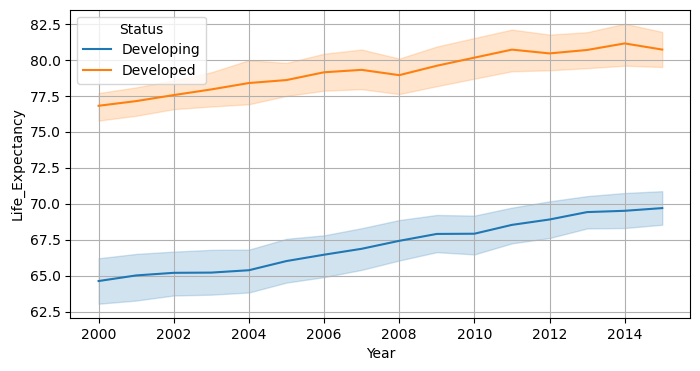

In [32]:
plt.figure(figsize=(8,4))
sns.lineplot(df_life,x='Year',y='Life_Expectancy',hue='Status')
plt.grid()
plt.show()

Text(0.5, 1.0, 'Percentage of data present according to country status')

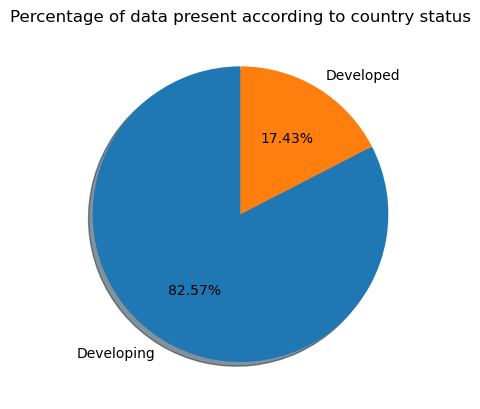

In [33]:
# Percentage of data present according to country status
plt.pie(df_life['Status'].value_counts(),labels=df_life['Status'].value_counts().index,
        autopct='%.2f%%',startangle=90,shadow=True)
plt.title('Percentage of data present according to country status')

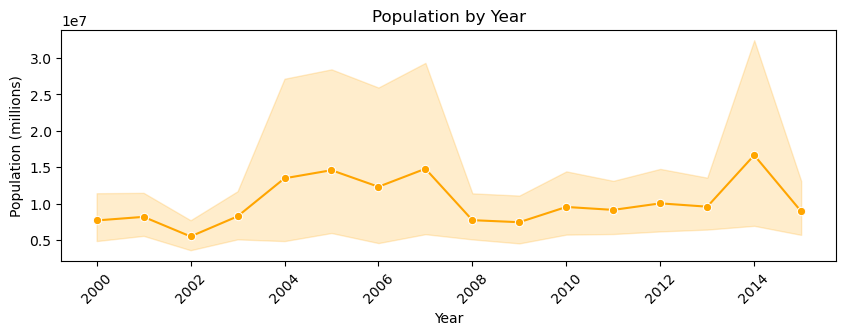

In [34]:
#Total population in year
plt.figure(figsize=(10, 3))
sns.lineplot(x='Year', y='Population', data=df_life, color='orange', marker='o')
plt.xlabel('Year')
plt.ylabel('Population (millions)')
plt.title('Population by Year')
plt.xticks(rotation=45)
plt.show()

# FEATURE ENGINEERING

In [35]:
# top 10 country on the basis of life expentency
top_10_coun=df_life.groupby('Country')['Life_Expectancy'].mean().reset_index(name='top_life').sort_values(by='top_life',ascending=False).head(10)

In [36]:
# bottom 10 country on the basis of life expentency
bottom_10_coun=df_life.groupby('Country')['Life_Expectancy'].mean().reset_index(name='bottom_life').sort_values(by='bottom_life',ascending=True).head(10)

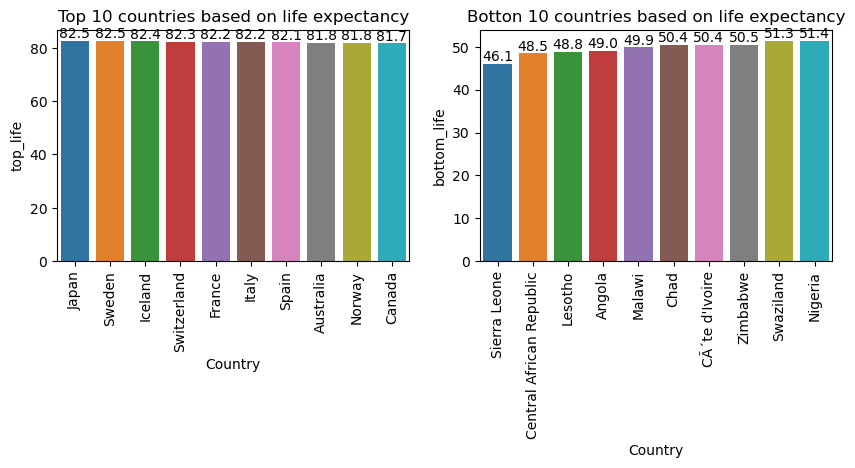

In [37]:
# Make a plot for top 10 and bottom 10 countries
plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 10 countries based on life expectancy')
ax=sns.barplot(top_10_coun,x='Country',y='top_life')
ax.bar_label(ax.containers[0],fmt='%.1f')
plt.xticks(rotation=90)

plt.subplot(1,2,2)
plt.title('Botton 10 countries based on life expectancy')

ax=sns.barplot(bottom_10_coun,x='Country',y='bottom_life')
ax.bar_label(ax.containers[0],fmt='%.1f')
plt.xticks(rotation=90)
plt.show()

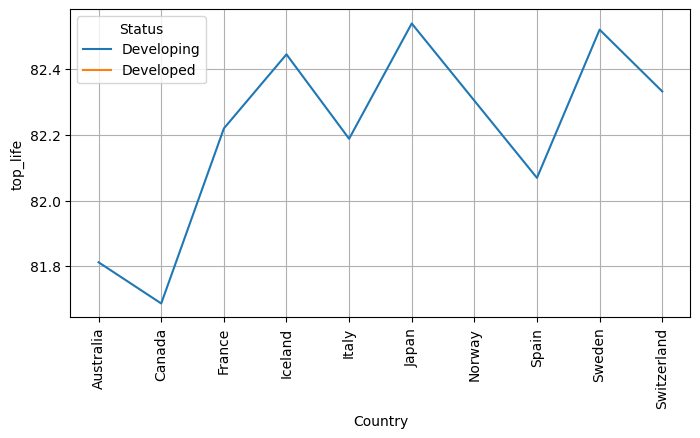

In [38]:
plt.figure(figsize=(8,4))
sns.lineplot(df_life,x=top_10_coun['Country'],y=top_10_coun['top_life'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()

# Feature Engineering
Created bins for age using def function ,that helps to key find out from data set.Created new columns and assigned as new_define _age.

In [39]:
#creating new column on the basis of age(name new_age)
def new_age(Life_Expectancy):
    if Life_Expectancy <= 40:
        return 'young_age'
    elif Life_Expectancy > 40 and Life_Expectancy < 70:
        return 'Middle_age'
    else:
        return 'old_age'

In [40]:
df_life['new_define_age'] = df_life['Life_Expectancy'].apply(new_age)

In [41]:
df_life.head(1)

,Country,Year,Status,Life_Expectancy,Adult_Mortality,Infant_deaths,Alcohol_Consum,Percentage_Expenditure,Hepatitis_B,Measeles,...,Total_Expenditure,Diabates,HIV_AIDS,GDP,Population,Thin_1_19_age,Thin_5_9_age,Income_Resources,Education,new_define_age
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,8.16,65.0,0.1,584.25921,33736494.0,17.2,17.3,0.479,10.1,Middle_age


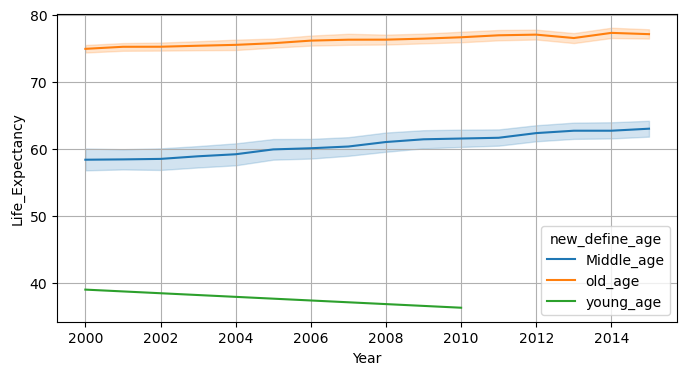

In [42]:
plt.figure(figsize=(8,4))
sns.lineplot(df_life,x='Year',y='Life_Expectancy',hue='new_define_age')
plt.grid()
plt.show()

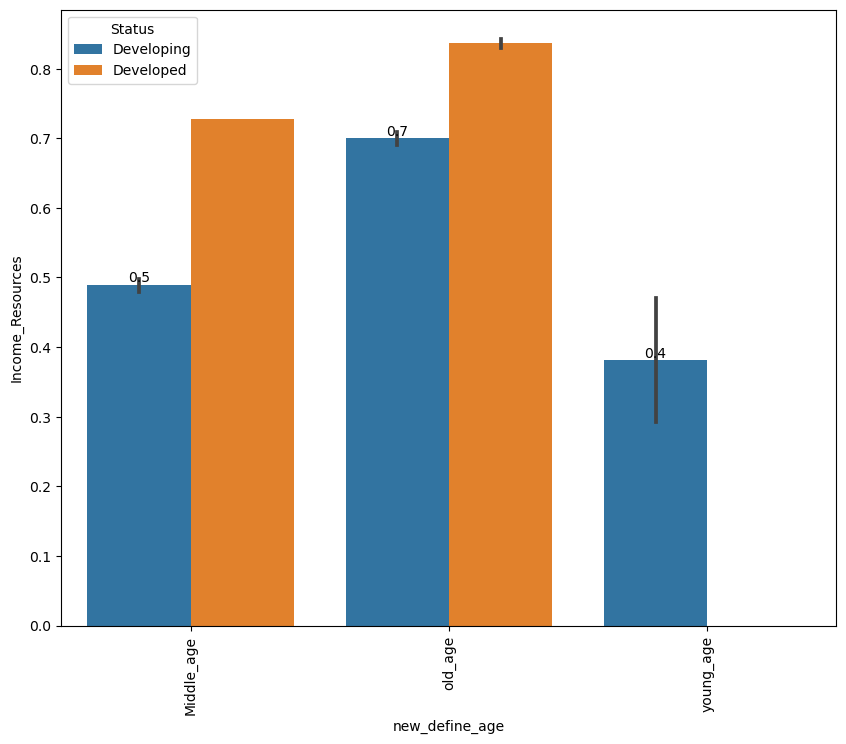

In [43]:
#To plot bar graph on the basis of new define age and income composition of resources
plt.figure(figsize=(10,8))
ax=sns.barplot(df_life,x='new_define_age',y='Income_Resources',hue='Status')
ax.bar_label(ax.containers[0],fmt='%.1f')
plt.xticks(rotation=90)
plt.show()

In [47]:
top_20_coun = df_life.groupby('Country')[['Life_Expectancy', 'Adult_Mortality',
       'Infant_deaths', 'Alcohol_Consum', 'Percentage_Expenditure',
       'Hepatitis_B', 'Measeles', 'BMI', 'Under_five_age_deaths', 'Polio',
       'Total_Expenditure', 'Diabates', 'HIV_AIDS', 'GDP', 'Population',
       'Thin_1_19_age', 'Thin_5_9_age', 'Income_Resources', 'Education']].mean().reset_index()

top_20_coun = top_20_coun.sort_values(by='Life_Expectancy', ascending=False).head(20)


In [48]:
bottom_20_coun = df_life.groupby('Country')[['Life_Expectancy', 'Adult_Mortality',
       'Infant_deaths', 'Alcohol_Consum', 'Percentage_Expenditure',
       'Hepatitis_B', 'Measeles', 'BMI', 'Under_five_age_deaths', 'Polio',
       'Total_Expenditure', 'Diabates', 'HIV_AIDS', 'GDP', 'Population',
       'Thin_1_19_age', 'Thin_5_9_age', 'Income_Resources', 'Education']].mean().reset_index()

bottom_20_coun = bottom_20_coun.sort_values(by='Life_Expectancy', ascending=True).head(20)

<Figure size 1000x300 with 0 Axes>

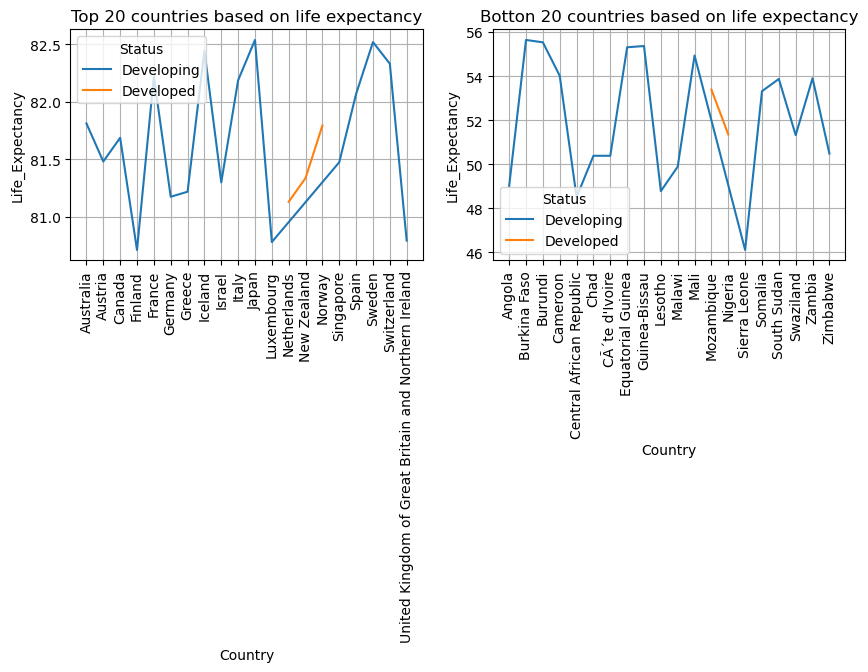

In [49]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on life expectancy')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Life_Expectancy'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on life expectancy')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Life_Expectancy'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

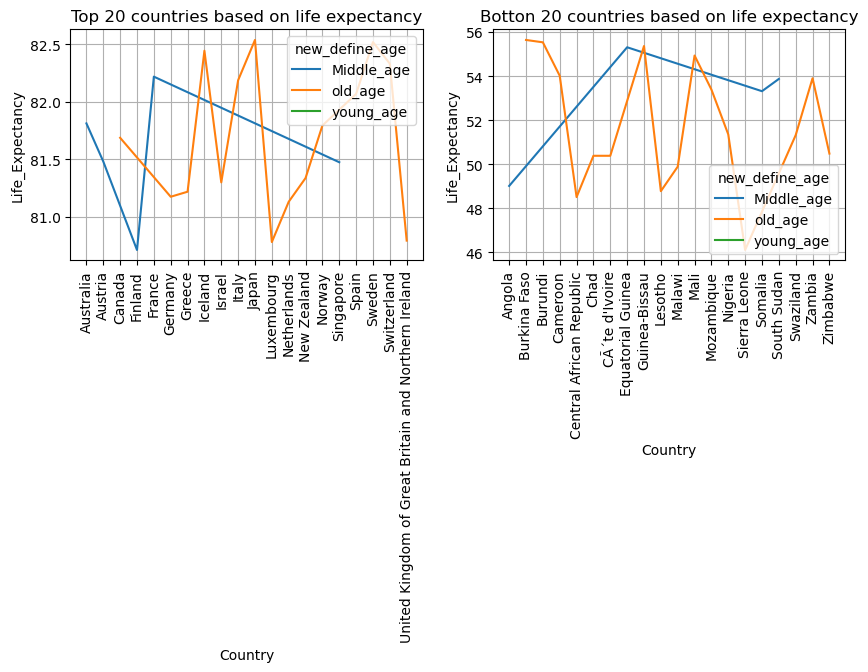

In [50]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on life expectancy')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Life_Expectancy'],hue='new_define_age')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on life expectancy')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Life_Expectancy'],hue='new_define_age')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

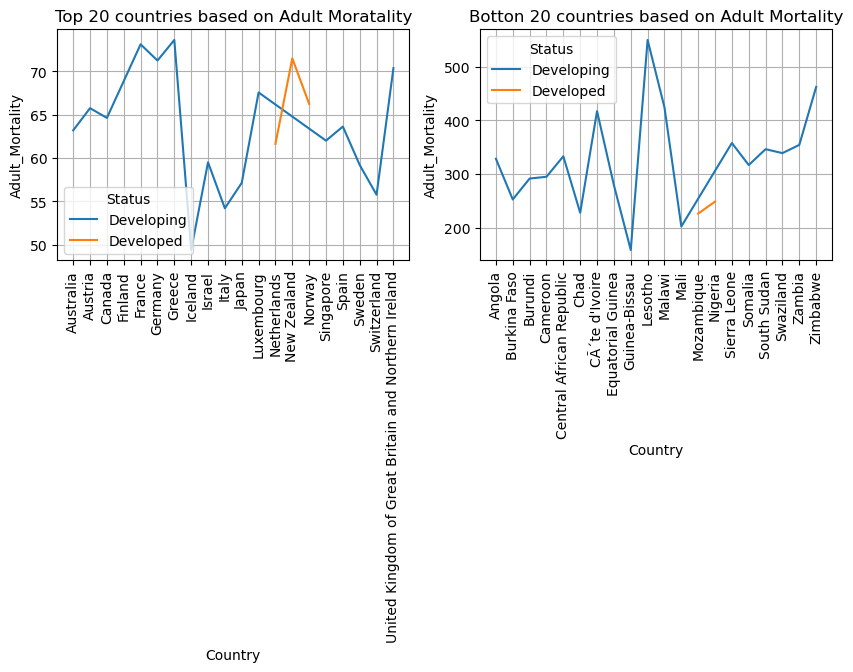

In [51]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on Adult Moratality')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Adult_Mortality'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on Adult Mortality')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Adult_Mortality'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

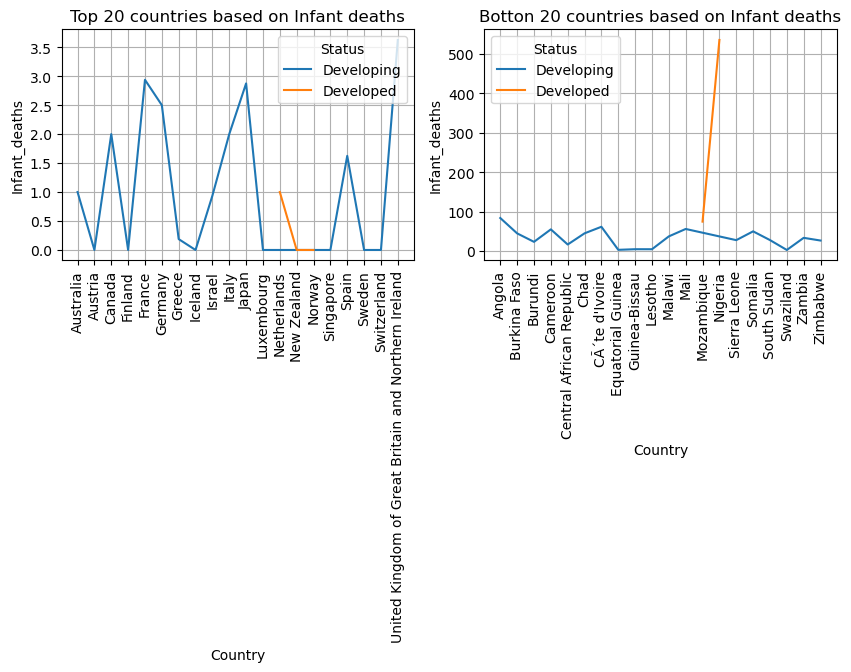

In [52]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on Infant deaths')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Infant_deaths'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on Infant deaths')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Infant_deaths'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

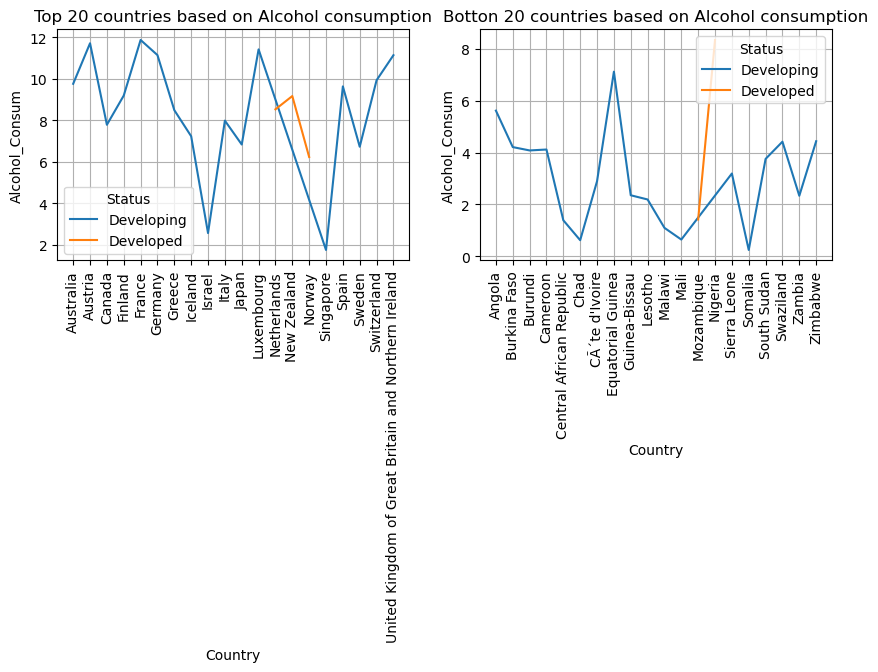

In [53]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on Alcohol consumption')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Alcohol_Consum'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on Alcohol consumption')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Alcohol_Consum'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

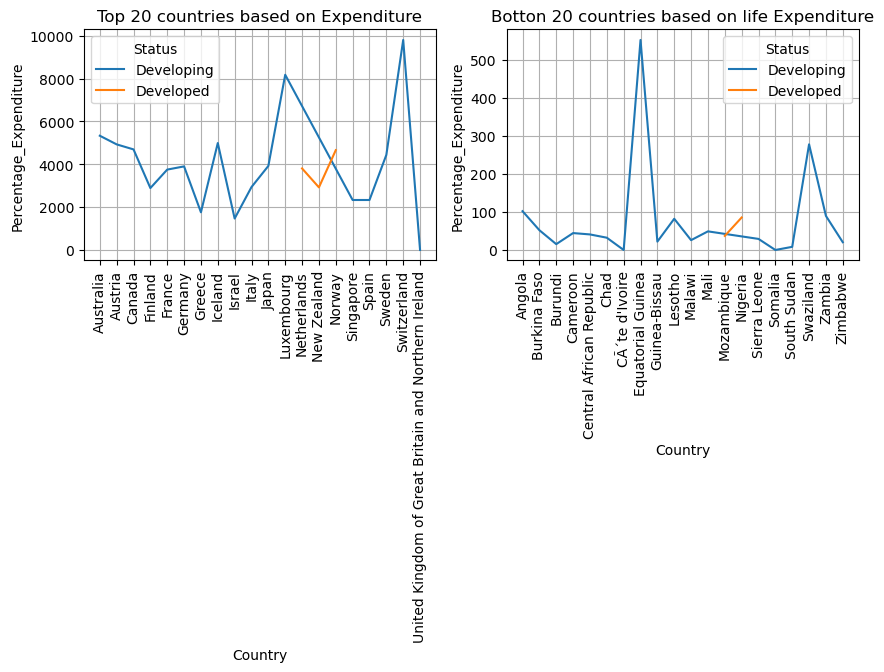

In [54]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on Expenditure')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Percentage_Expenditure'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on life Expenditure')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Percentage_Expenditure'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

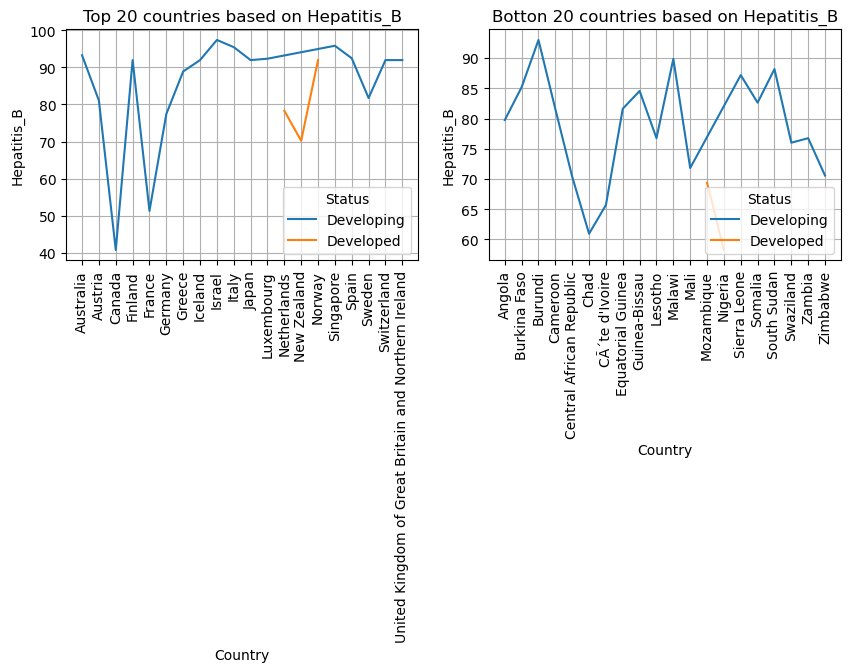

In [56]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on Hepatitis_B')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Hepatitis_B'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on Hepatitis_B')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Hepatitis_B'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

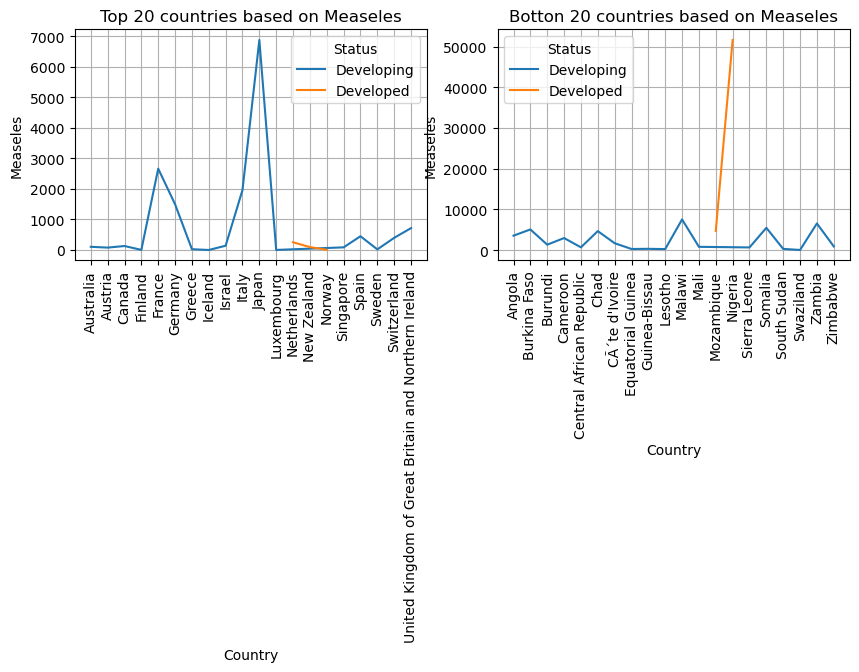

In [57]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on Measeles')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Measeles'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on Measeles')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Measeles'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

Why this specific graph used?
line charts are a powerful tool in data visualization due to their ability to effectively display trends, compare multiple data sets, and highlight changes over time while maintaining simplicity and clarity. They are particularly well-suited for time series analysis and any data where continuity and trend recognition are important.

what are insights of this linechart?
In this line chart we can see that in top 20 countries is likely eqaually affected with Measels disease to bottom 20 countries that show  this is also a lead factor in decreasing life expectancy of human in all country.

<Figure size 1000x300 with 0 Axes>

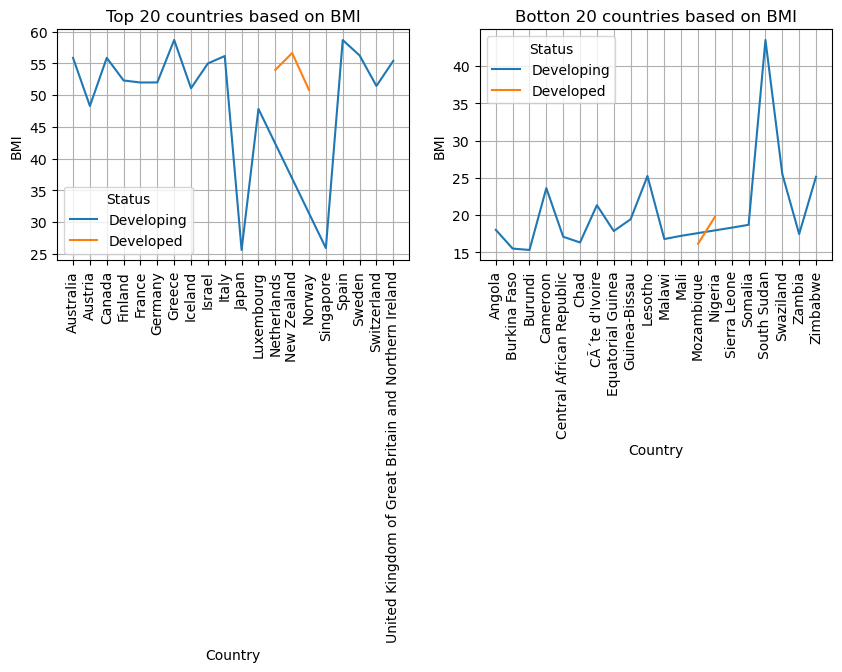

In [59]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on BMI')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['BMI'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on BMI')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['BMI'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

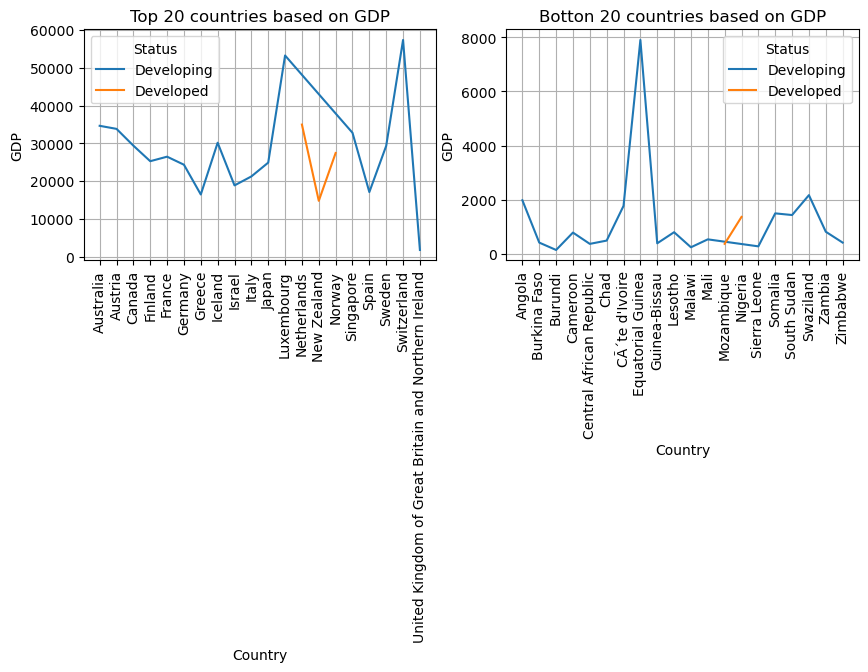

In [62]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on GDP')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['GDP'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on GDP')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['GDP'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

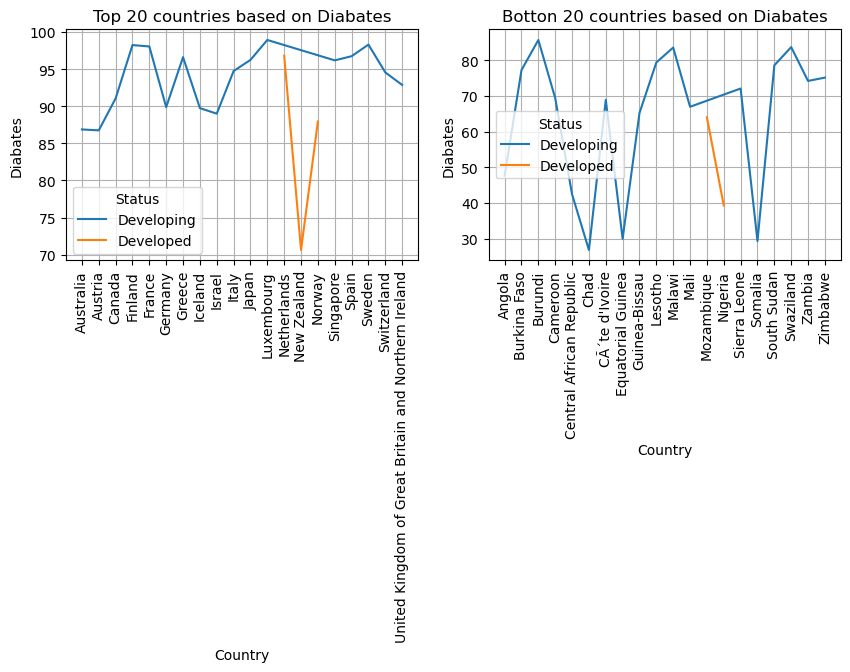

In [64]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on Diabates')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Diabates'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on Diabates')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Diabates'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

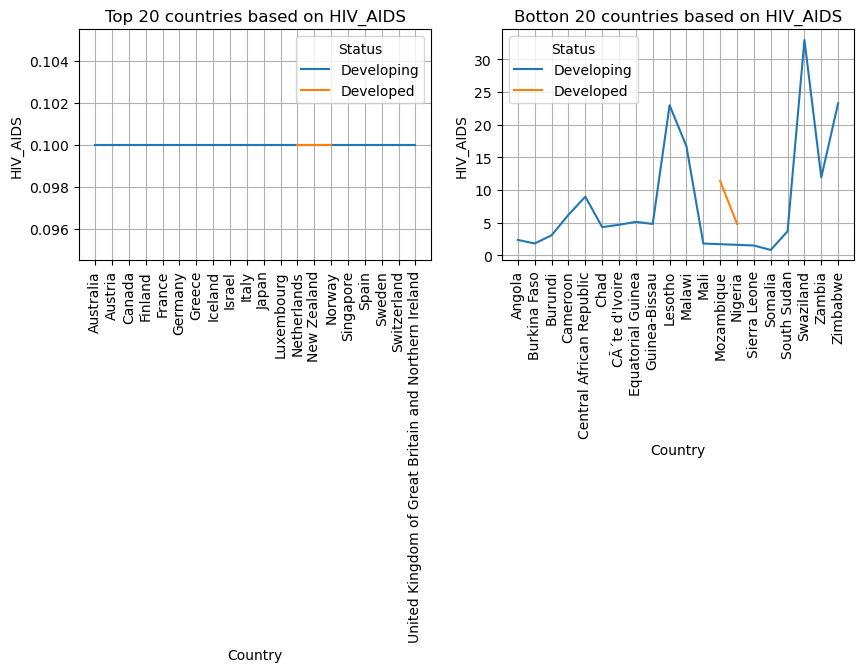

In [65]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on HIV_AIDS')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['HIV_AIDS'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on HIV_AIDS')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['HIV_AIDS'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

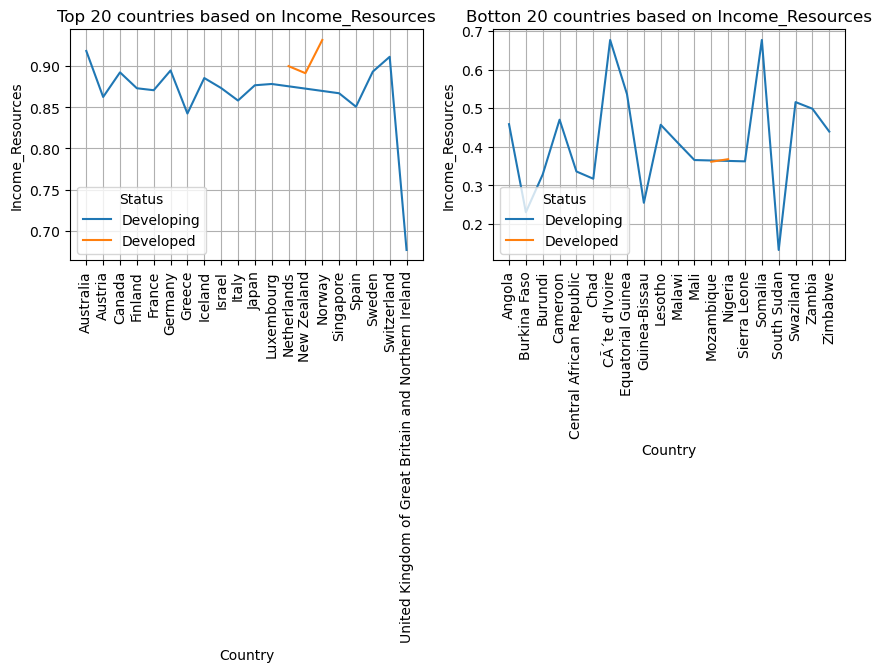

In [69]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on Income_Resources')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Income_Resources'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on Income_Resources')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Income_Resources'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

<Figure size 1000x300 with 0 Axes>

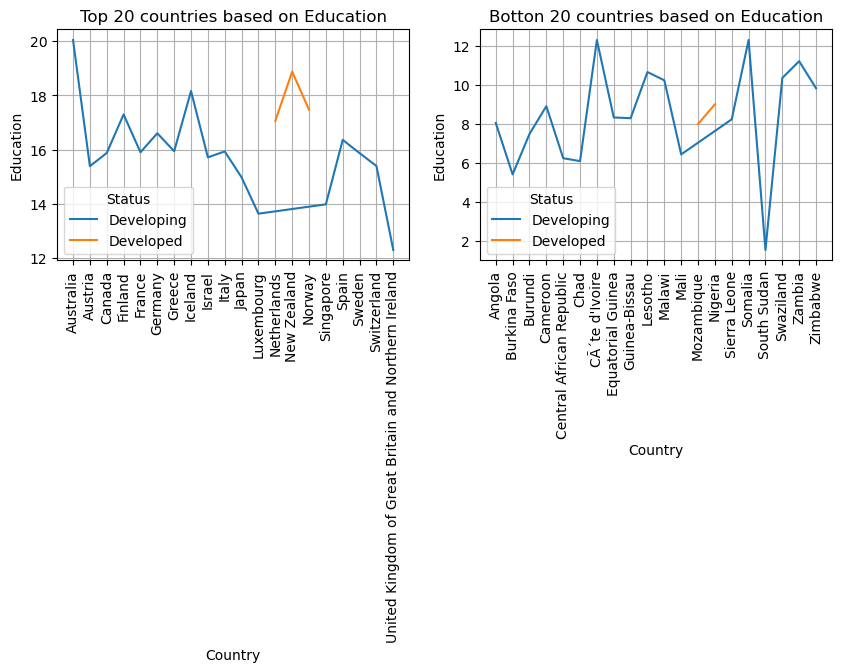

In [70]:
plt.figure(figsize=(10, 3))

plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.title('Top 20 countries based on Education')
sns.lineplot(df_life,x=top_20_coun['Country'],y=top_20_coun['Education'],hue='Status')
plt.xticks(rotation=90)
plt.grid()

plt.subplot(1,2,2)
plt.title('Botton 20 countries based on Education')

sns.lineplot(df_life,x=bottom_20_coun['Country'],y=bottom_20_coun['Education'],hue='Status')
plt.xticks(rotation=90)
plt.grid()
plt.show()
plt.show()

In [71]:
df_life.columns

Index(['Country', 'Year', 'Status', 'Life_Expectancy', 'Adult_Mortality',
       'Infant_deaths', 'Alcohol_Consum', 'Percentage_Expenditure',
       'Hepatitis_B', 'Measeles', 'BMI', 'Under_five_age_deaths', 'Polio',
       'Total_Expenditure', 'Diabates', 'HIV_AIDS', 'GDP', 'Population',
       'Thin_1_19_age', 'Thin_5_9_age', 'Income_Resources', 'Education',
       'new_define_age'],
      dtype='object')

<Figure size 1200x800 with 0 Axes>

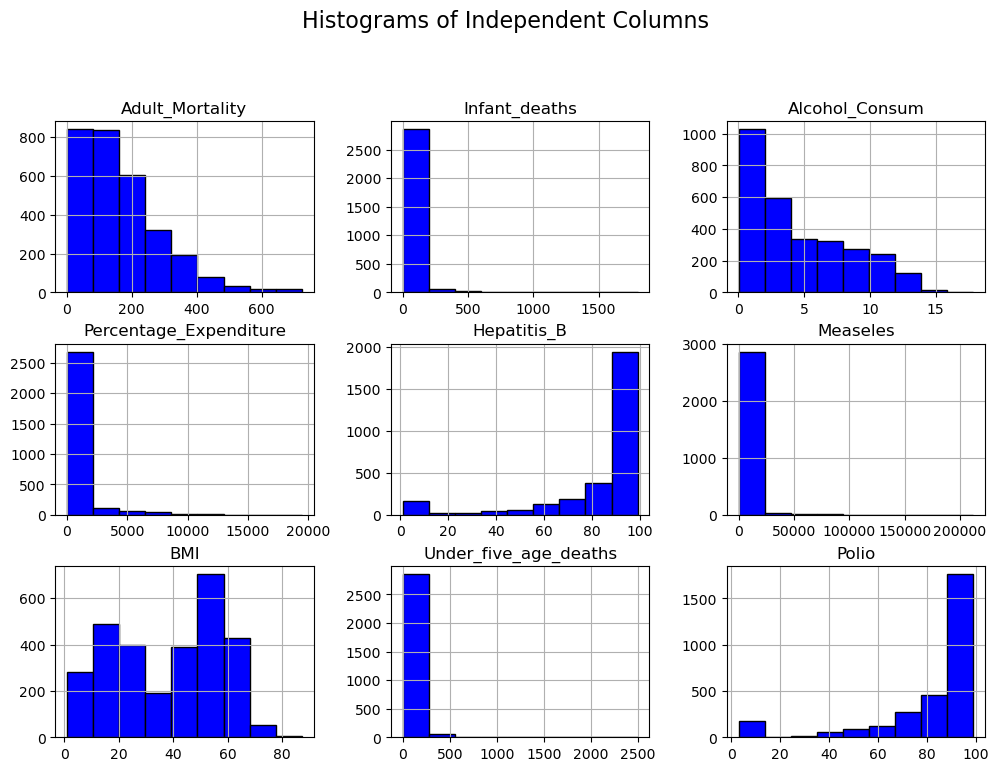

In [72]:
import matplotlib.pyplot as plt

# Assuming df_life is your DataFrame and is already loaded
selected_columns = ['Adult_Mortality', 'Infant_deaths', 'Alcohol_Consum', 'Percentage_Expenditure','Hepatitis_B', 'Measeles', 'BMI', 'Under_five_age_deaths', 'Polio'
]

plt.figure(figsize=(12, 8))  # Set the figure size once here

# Plot the histograms
df_life[selected_columns].hist(bins=9, color='Blue', edgecolor='black', grid=True, layout=(3, 3), figsize=(12, 8))

plt.suptitle('Histograms of Independent Columns', x=0.5, y=1.02, fontsize=16)
plt.show()


<Figure size 1200x800 with 0 Axes>

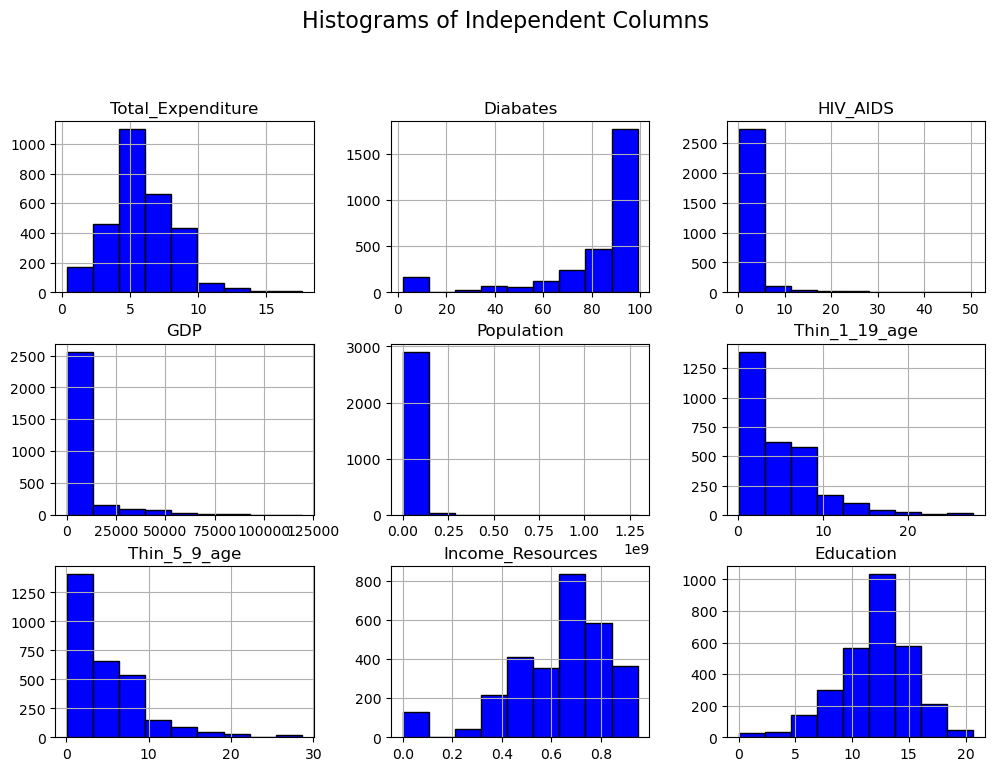

In [73]:
selected_columns = ['Total_Expenditure', 'Diabates', 'HIV_AIDS', 'GDP', 'Population',
       'Thin_1_19_age', 'Thin_5_9_age', 'Income_Resources', 'Education'
]

plt.figure(figsize=(12, 8))  # Set the figure size once here

# Plot the histograms
df_life[selected_columns].hist(bins=9, color='Blue', edgecolor='black', grid=True, layout=(3, 3), figsize=(12, 8))

plt.suptitle('Histograms of Independent Columns', x=0.5, y=1.02, fontsize=16)
plt.show()


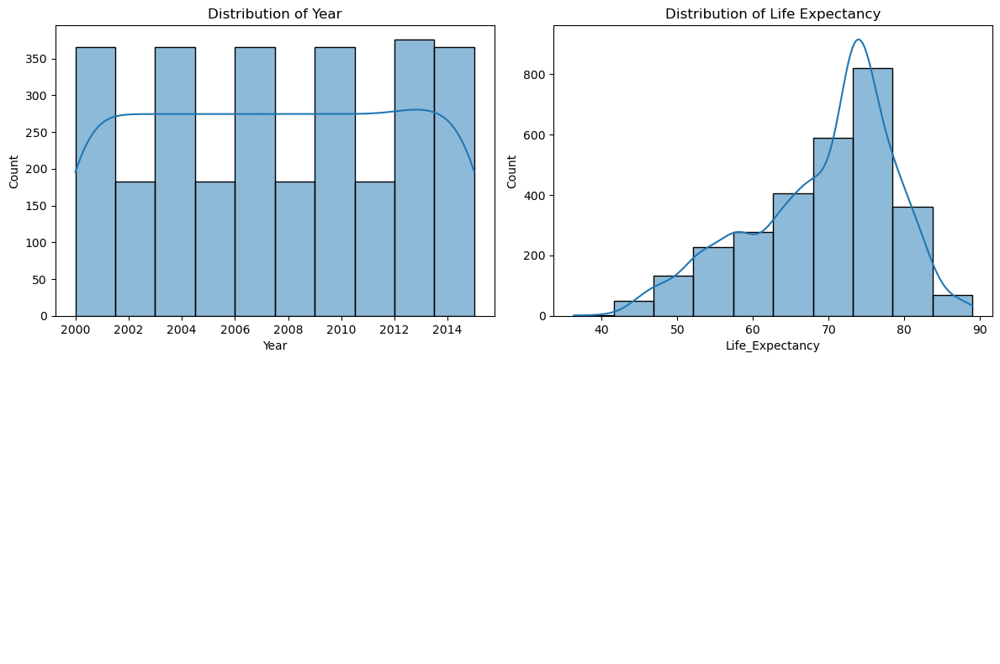

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_life is your DataFrame and is already loaded
f, ax = plt.subplots(2, 2, figsize=(12, 8))

# Plotting the distributions
sns.histplot(df_life["Year"], bins=10, kde=True, ax=ax[0][0]).set_title('Distribution of Year')
sns.histplot(df_life["Life_Expectancy"], bins=10, kde=True, ax=ax[0][1]).set_title('Distribution of Life Expectancy')

# Hide the empty subplots
ax[1][0].axis('off')
ax[1][1].axis('off')

# Adjust layout for better visualization
plt.tight_layout()
plt.show()


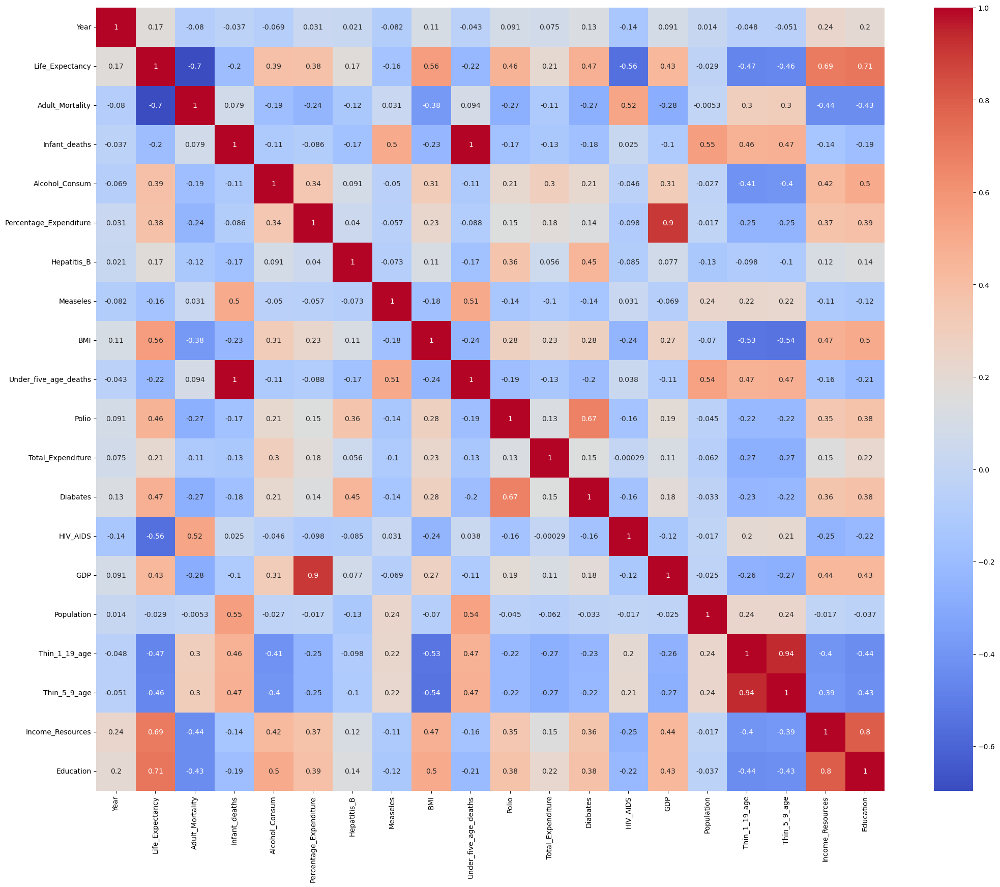

In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_life is your DataFrame
col = ['Year','Life_Expectancy', 'Adult_Mortality',
       'Infant_deaths', 'Alcohol_Consum', 'Percentage_Expenditure',
       'Hepatitis_B', 'Measeles', 'BMI', 'Under_five_age_deaths', 'Polio',
       'Total_Expenditure', 'Diabates', 'HIV_AIDS', 'GDP', 'Population',
       'Thin_1_19_age', 'Thin_5_9_age', 'Income_Resources', 'Education']

# Subset the DataFrame to include only the relevant columns
df_subset = df_life[col]

# Calculate the correlation matrix
corr_matrix = df_subset.corr()

# Create the heatmap with a larger size
plt.figure(figsize=(25, 20))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)

# Show the plot
plt.show()

C:\Users\admin\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1507: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
C:\Users\admin\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1507: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
C:\Users\admin\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1507: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
C:\Users\admin\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1507: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  fu

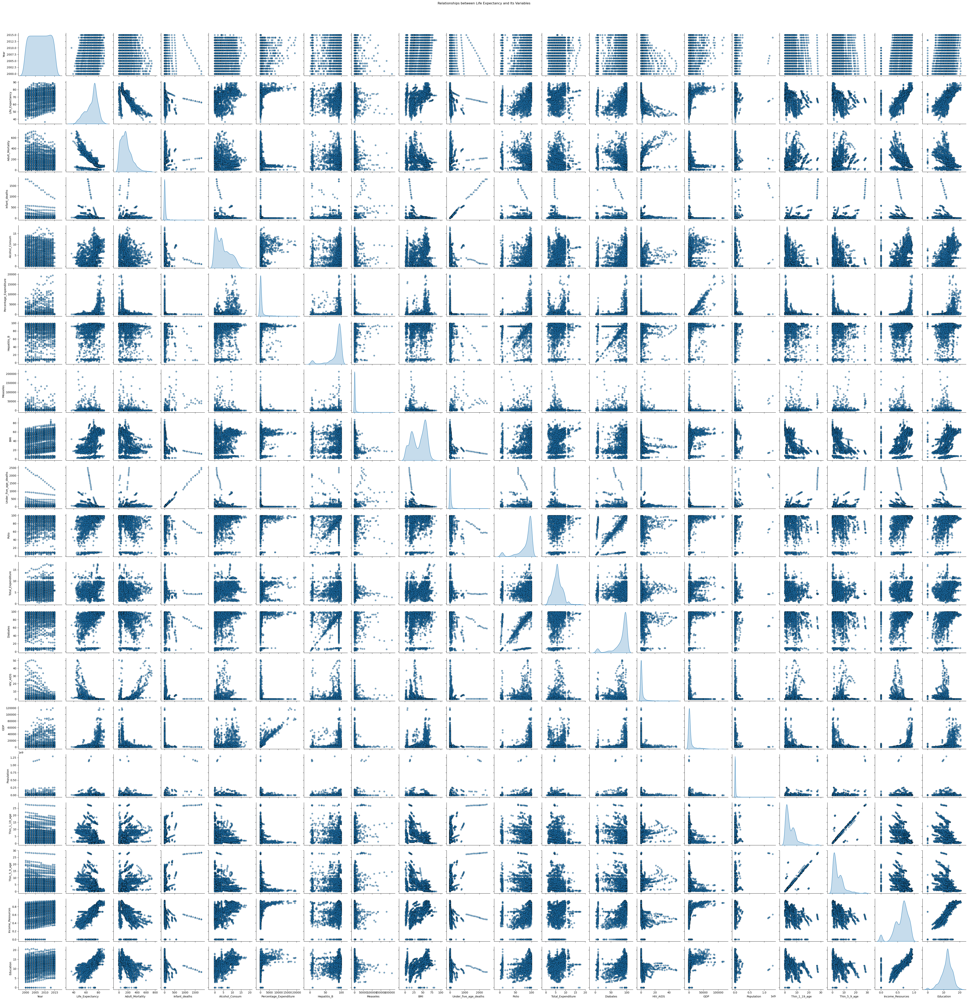

In [78]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_life is your DataFrame
cols = ['Year','Life_Expectancy', 'Adult_Mortality',
       'Infant_deaths', 'Alcohol_Consum', 'Percentage_Expenditure',
       'Hepatitis_B', 'Measeles', 'BMI', 'Under_five_age_deaths', 'Polio',
       'Total_Expenditure', 'Diabates', 'HIV_AIDS', 'GDP', 'Population',
       'Thin_1_19_age', 'Thin_5_9_age', 'Income_Resources', 'Education']

# Pairplot to visualize the relationships
sns.pairplot(df_life[cols], kind='scatter', diag_kind='kde', 
             plot_kws={'alpha':0.6, 's':30, 'edgecolor':'k'}, diag_kws={'shade':True})

plt.suptitle('Relationships between Life Expectancy and Its Variables', y=1.02)
plt.show()